In [1]:
#imports

import pandas as pd
import numpy as np
import seaborn as sns
import math
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

#Random Forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz

#default fig size
plt.rcParams['figure.figsize'] = [10, 5]

#stats
import statsmodels.api as sm
from scipy import stats
from scipy.stats import norm
from scipy.stats import f_oneway,kruskal

#unsupervised learning
from sklearn.cluster import KMeans
kmeans = KMeans()
from PlottingFunctions import plot_inertia, plot_silhouette



# Data Cleaning and preparation

In [2]:
#load data

data = pd.read_csv("data/data.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [3]:
#check for NA
data_isna = data.isna().sum()/len(data)*100
data_isna[data_isna>0].sort_values(ascending=False)

292    91.193363
157    91.193363
158    91.193363
293    91.193363
220    85.577537
         ...    
182     0.063816
181     0.063816
180     0.063816
179     0.063816
589     0.063816
Length: 538, dtype: float64

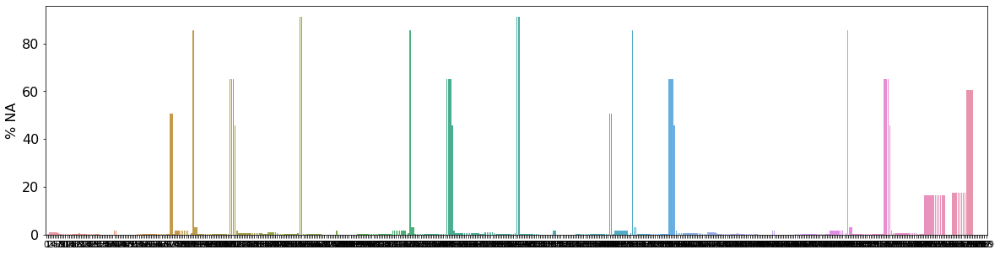

In [4]:
plt.rcParams['figure.figsize'] = [20, 5]
plt.ylabel('% NA', fontsize=16)
plt.yticks(fontsize=16)
na_gt_zero = data_isna[data_isna>0]
sns.barplot(x=na_gt_zero.index,y=na_gt_zero)

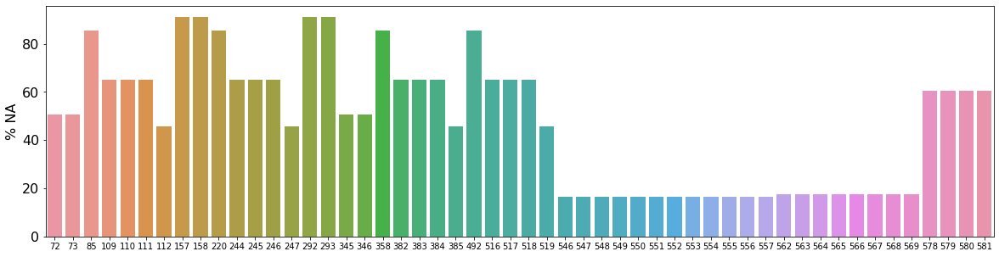

In [5]:
#replot with limit = 15%
#15% of 1567 is 235 rows
plt.rcParams['figure.figsize'] = [20, 5]
plt.ylabel('% NA', fontsize=16)
plt.yticks(fontsize=16)
na_gt_limit = data_isna[data_isna>15]
sns.barplot(x=na_gt_limit.index,y=na_gt_limit)

In [10]:
len(na_gt_limit.index)
na_gt_limit.index

Index(['72', '73', '85', '109', '110', '111', '112', '157', '158', '220',
       '244', '245', '246', '247', '292', '293', '345', '346', '358', '382',
       '383', '384', '385', '492', '516', '517', '518', '519', '546', '547',
       '548', '549', '550', '551', '552', '553', '554', '555', '556', '557',
       '562', '563', '564', '565', '566', '567', '568', '569', '578', '579',
       '580', '581'],
      dtype='object')

In [7]:
data.drop(na_gt_limit.index, inplace=True, axis=1)
print("done")

done


In [51]:
#Some features don't vary. Drop them.
features = data.drop(['Time','Pass/Fail'],axis=1)
features_range = features.max()-features.min()
no_var_features = features_range[features_range==0]
data.drop(no_var_features.index, inplace=True, axis=1)
data.columns #424 Columns remain

Index(['Time', '0', '1', '2', '3', '4', '6', '7', '8', '9',
       ...
       '577', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=424)

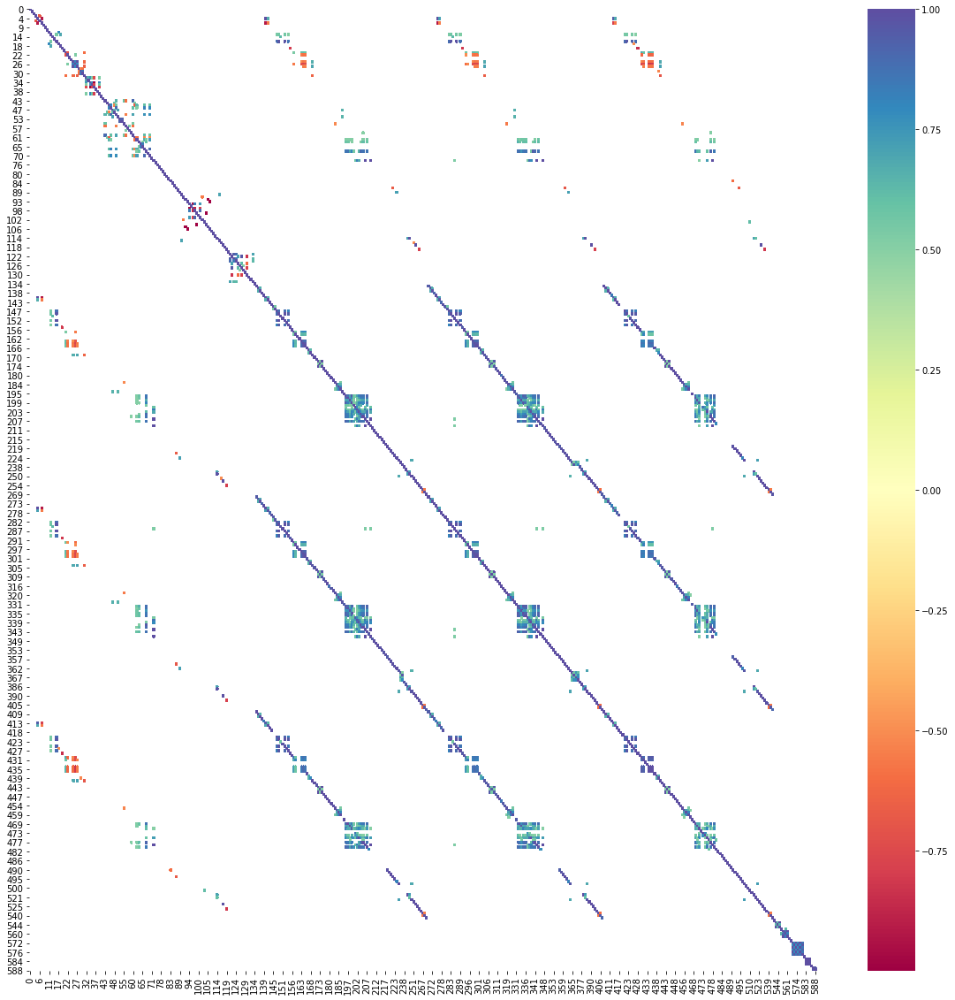

In [52]:
corrs = features.corr()
plt.rcParams['figure.figsize'] = [20, 20]
sns.heatmap(corrs[abs(corrs)>0.5], cmap="Spectral")

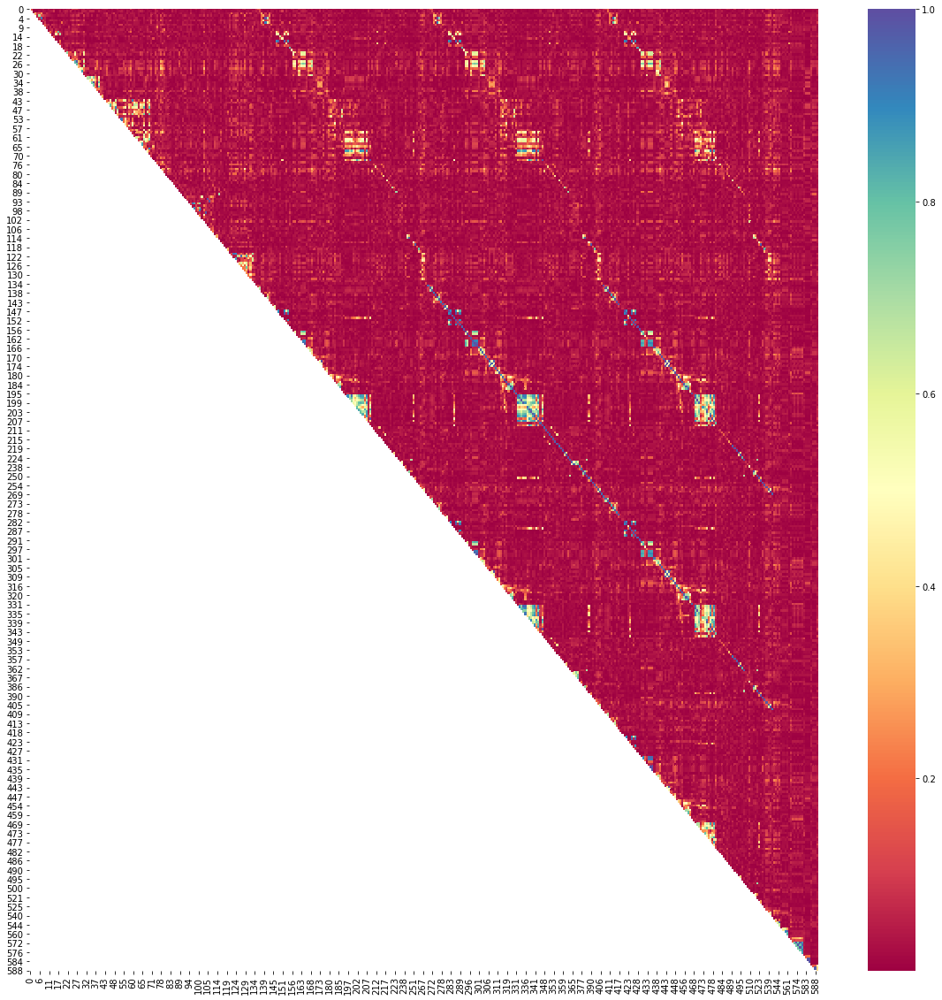

In [56]:
corrs_abs = corrs.abs()
upper_tri = corrs_abs.where(np.triu(np.ones(corrs_abs.shape),k=1).astype(np.bool))
upper_tri

sns.heatmap(upper_tri, cmap="Spectral")

In [60]:
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
len(to_drop)

212

In [64]:
data.drop(to_drop, inplace=True, axis=1)
data.columns #212 columns remain

Index(['Time', '0', '1', '2', '3', '4', '6', '8', '9', '10',
       ...
       '570', '571', '572', '573', '582', '583', '586', '587', '589',
       'Pass/Fail'],
      dtype='object', length=212)

In [65]:
#Train-test split
data_x = data.drop(['Time','Pass/Fail'], axis=1)
data_y=data['Pass/Fail']
na_filler = 99999999999999
X_train, X_test, y_train, y_test = train_test_split(data_x.fillna(na_filler), data_y, test_size=0.2, random_state = 42)

# Random Forest

In [66]:
#Random Forest modelling
tree_model = RandomForestClassifier(oob_score = True, n_estimators=100)
tree_model.get_params()



{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': True,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [67]:
tree_model.fit(X_train,y_train)
print("train score:",tree_model.score(X_train, y_train))
print("train oob score:",tree_model.oob_score_)
print("test score:", tree_model.score(X_test,y_test))
print("Number of columns: ",len(X_train.columns))
#Before eliminating correlated features and no variation features, train/test score was 1/0.92


train score: 1.0
train oob score: 0.9361532322426177
test score: 0.9203821656050956
Number of columns:  210


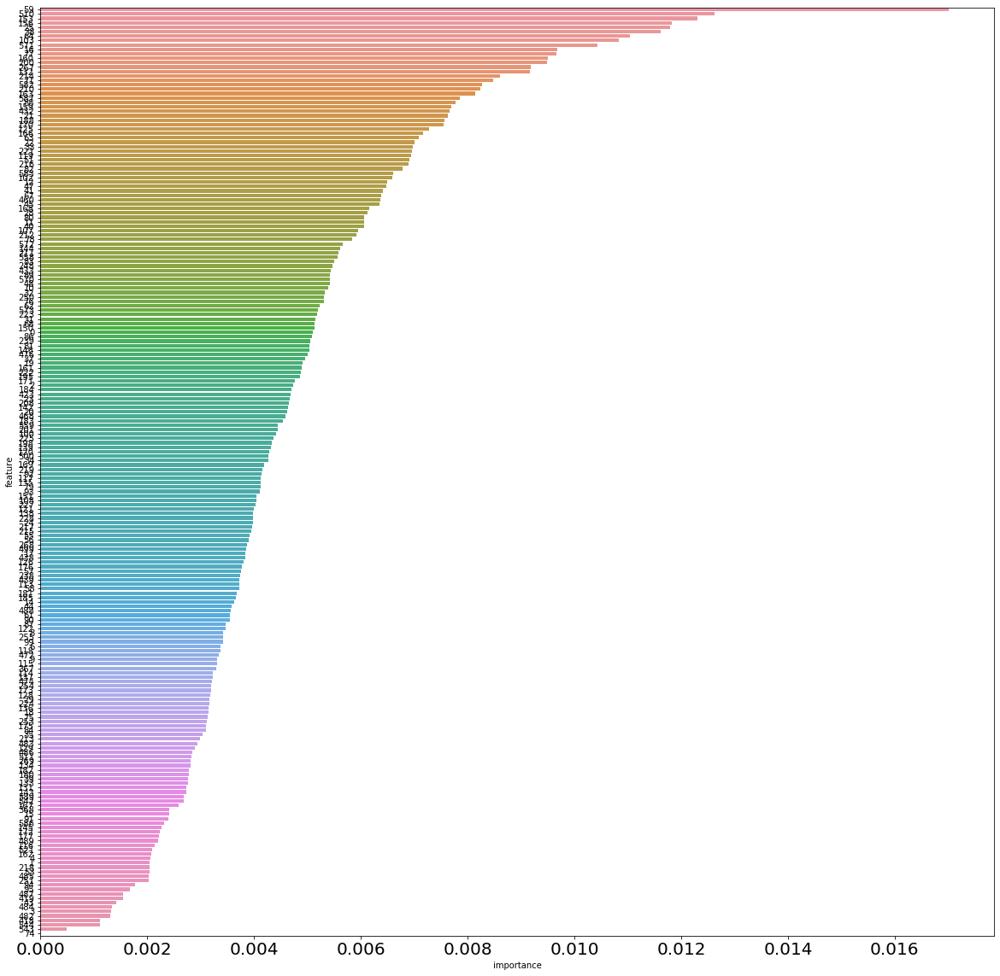

In [69]:
tree_model_params = pd.DataFrame({'feature':X_train.columns,'importance':tree_model.feature_importances_}).sort_values(by='importance',ascending=False)
tree_model_params.to_csv("tree_model_params.csv")
plt.rcParams['figure.figsize'] = [20, 20]
plt.xticks(fontsize=20)
sns.barplot(x=tree_model_params['importance'],y=tree_model_params['feature'][:filter])


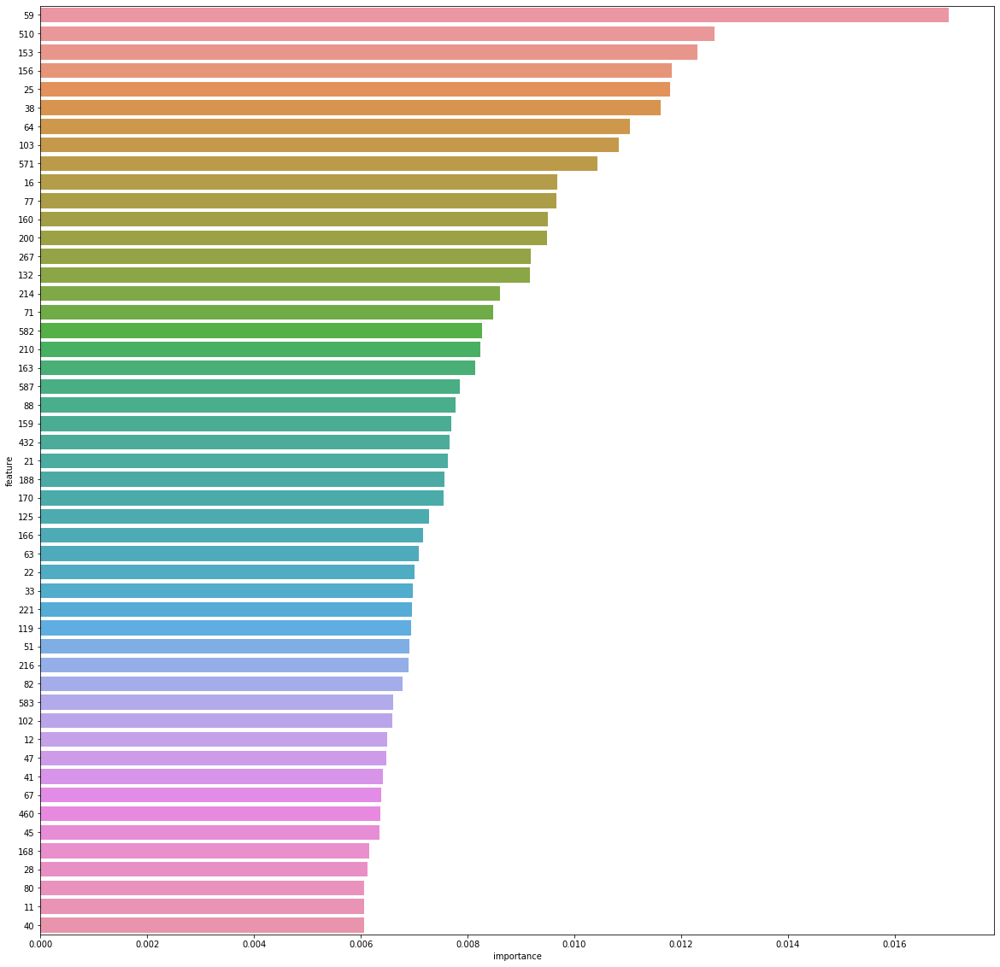

In [70]:
filter=50
sns.barplot(x=tree_model_params['importance'][:filter],y=tree_model_params['feature'][:filter])

In [71]:
#visualize tree
estimator = tree_model.estimators_[5]

predictor_names = y_train
column_names = [str(x) for x in X_train.columns ]
predictor_names = [str(y) for y in y_train.unique()]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = column_names,
                class_names = predictor_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')


How does this impact decisions of different modules?
If parameter is controllable, choose the one which will lead to higher chance of success. Can this be done lot by lot? Or does the tool average need to be recentered?

How to quantify highest chance of success? At each branch, we can calculate the probabilities using <strong>the cumulative distribution function</strong>.

Can also make decision based on what is simplest (i.e. les branches).




In [32]:
#Test rules is manually made by looking at the tree picture and typing the limit.
test_rules = pd.read_csv("data/test_rules.csv")

In [33]:
test_rules

,Feature,Rule,limit
0,64,LT,2.516000e+01
1,283,LT,2.050000e+00
2,280,LT,1.000000e-02
3,307,LT,8.000000e-02
4,561,LT,3.333000e+01
5,472,LT,1.676600e+02
6,454,LT,5.150000e+00
7,457,LT,8.280000e+00
8,339,LT,1.032000e+01
9,304,LT,3.000000e-02


For each of the rules, find the probability that it is less than the limit. Note that all rules are "less than". Also need to filter out N/A values. Also need to filter out data points that are outside N sigma.


In [34]:
def clean_data(data):
    data.dropna(inplace=True) #drop 
    sigma = data.std()
    mean = data.mean()
    N_sig = 2
    LL = mean - N_sig*sigma
    UL = mean + N_sig*sigma
    
    return data[(LL < data) & (data < UL)]
    

def get_cdf(data,limit):
    
    return norm.cdf(limit, loc=data.mean(), scale=data.std())


In [35]:
# #Take an example feature and check the cummulative probability up to the limit
sample_f = '283'
test_data = clean_data(data[sample_f])

print(test_data.mean())
print(test_data.max())
print(test_data.min())
print(test_data.std())




2.6569248721227643
7.4302
0.505
0.7383881857109369


/Users/enzomangubat/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


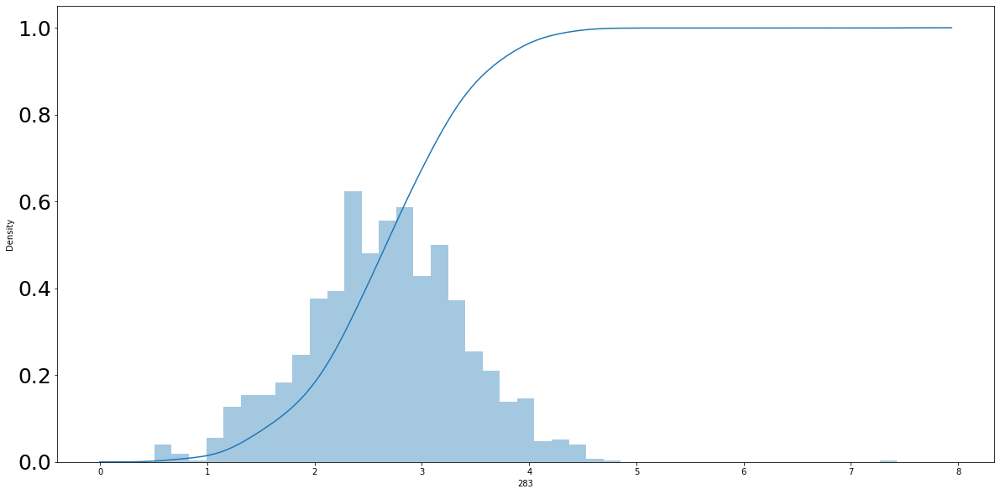

In [103]:
plt.rcParams['figure.figsize'] = [20, 10]
plt.yticks(fontsize=25)
sns.distplot(test_data, kde_kws = {'cumulative': True})
#sns.displot(test_data, kind='ecdf') #if in the future the above doesn't work anymore

In [37]:
get_cdf(test_data,3) 
#This returns the probability of selected a value less than the specified limit given the distribution.

0.6789007228050281

In [38]:
help(norm.cdf)

Help on method cdf in module scipy.stats._distn_infrastructure:

cdf(x, *args, **kwds) method of scipy.stats._continuous_distns.norm_gen instance
    Cumulative distribution function of the given RV.
    
    Parameters
    ----------
    x : array_like
        quantiles
    arg1, arg2, arg3,... : array_like
        The shape parameter(s) for the distribution (see docstring of the
        instance object for more information)
    loc : array_like, optional
        location parameter (default=0)
    scale : array_like, optional
        scale parameter (default=1)
    
    Returns
    -------
    cdf : ndarray
        Cumulative distribution function evaluated at `x`



In [39]:
test_rules['prob_LT']=[get_cdf(clean_data(data[str(test_rules.loc[x,'Feature'])]),test_rules.loc[x,'limit']) for x in test_rules.index]

In [40]:
test_rules

,Feature,Rule,limit,prob_LT
0,64,LT,2.516000e+01,0.914795
1,283,LT,2.050000e+00,0.205550
2,280,LT,1.000000e-02,0.051713
3,307,LT,8.000000e-02,0.019321
4,561,LT,3.333000e+01,0.574035
5,472,LT,1.676600e+02,0.774556
6,454,LT,5.150000e+00,0.156521
7,457,LT,8.280000e+00,0.957398
8,339,LT,1.032000e+01,0.750510
9,304,LT,3.000000e-02,0.053689


# Unsupervised Learning

Try to find clusters and figured out what the pass/fail rates are of each.


In [72]:
data.head()

,Time,0,1,2,3,4,6,8,9,10,...,570,571,572,573,582,583,586,587,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,1.5005,0.0162,-0.0034,...,533.8500,2.1113,8.95,0.3157,0.5005,0.0118,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,1.4966,-0.0005,-0.0148,...,535.0164,2.4335,5.92,0.2653,0.5019,0.0223,0.0096,0.0201,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,1.4436,0.0041,0.0013,...,535.0245,2.0293,11.21,0.1882,0.4958,0.0157,0.0584,0.0484,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,1.4882,-0.0124,-0.0033,...,530.5682,2.0253,9.33,0.1738,0.4990,0.0103,0.0202,0.0149,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,1.5031,-0.0031,-0.0072,...,532.0155,2.0275,8.83,0.2224,0.4800,0.4766,0.0202,0.0149,73.8432,-1


In [73]:
#initial K-means clustering
kmeans = KMeans()
kmeans.set_params(n_clusters=8) #8 is the default
UL_data = data.drop(['Time','Pass/Fail'],axis=1).fillna(data.mean())
kmeans.fit(UL_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

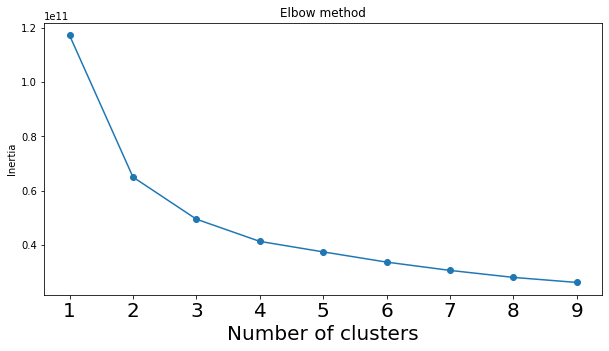

In [74]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.xlabel('N clusters',fontsize=20)
plt.xticks(fontsize=20)
plot_inertia(kmeans, UL_data, range(1, 10))
#Looks like elbow is between 2 and 3. Let's try 2 and see if they are the same clusters as pass/fail.

In [75]:
kmeans.set_params(n_clusters=2)
kmeans.fit(UL_data)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [76]:
UL_data

,0,1,2,3,4,6,8,9,10,11,...,559,570,571,572,573,582,583,586,587,589
0,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,1.500500,0.016200,-0.003400,0.945500,...,0.4385,533.8500,2.1113,8.95,0.3157,0.5005,0.0118,0.021458,0.016475,99.670066
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,1.496600,-0.000500,-0.014800,0.962700,...,0.1745,535.0164,2.4335,5.92,0.2653,0.5019,0.0223,0.009600,0.020100,208.204500
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,1.443600,0.004100,0.001300,0.961500,...,0.3718,535.0245,2.0293,11.21,0.1882,0.4958,0.0157,0.058400,0.048400,82.860200
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,1.488200,-0.012400,-0.003300,0.962900,...,0.7288,530.5682,2.0253,9.33,0.1738,0.4990,0.0103,0.020200,0.014900,73.843200
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,1.503100,-0.003100,-0.007200,0.956900,...,0.2156,532.0155,2.0275,8.83,0.2224,0.4800,0.4766,0.020200,0.014900,73.843200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2899.41,2464.36,2179.7333,3085.3781,1.4843,82.2467,1.342400,-0.004500,-0.005700,0.957900,...,0.3553,536.3418,2.0153,7.98,0.2363,0.4988,0.0143,0.006800,0.013800,203.172000
1563,3052.31,2522.55,2198.5667,1124.6595,0.8763,98.4689,1.433300,-0.006100,-0.009300,0.961800,...,0.3105,537.9264,2.1814,5.48,0.3891,0.4975,0.0131,0.006800,0.013800,203.172000
1564,2978.81,2379.78,2206.3000,1110.4967,0.8236,99.4122,1.462862,-0.000841,0.000146,0.964353,...,0.1266,530.3709,2.3435,6.49,0.4154,0.4987,0.0153,0.019700,0.008600,43.523100
1565,2894.92,2532.01,2177.0333,1183.7287,1.5726,98.7978,1.462200,-0.007200,0.003200,0.969400,...,0.1920,534.3936,1.9098,9.13,0.3669,0.5004,0.0178,0.026200,0.024500,93.494100


In [77]:
len(data)

1567

In [78]:
#get the clusters
pd.Series(kmeans.labels_).unique()

array([0, 1])

In [79]:
len(kmeans.labels_)

1567

In [80]:
data['clusters'] = kmeans.labels_

In [81]:
data

,Time,0,1,2,3,4,6,8,9,10,...,571,572,573,582,583,586,587,589,Pass/Fail,clusters
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,97.6133,1.5005,0.0162,-0.0034,...,2.1113,8.95,0.3157,0.5005,0.0118,NaN,NaN,NaN,-1,0
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,1.4966,-0.0005,-0.0148,...,2.4335,5.92,0.2653,0.5019,0.0223,0.0096,0.0201,208.2045,-1,0
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,1.4436,0.0041,0.0013,...,2.0293,11.21,0.1882,0.4958,0.0157,0.0584,0.0484,82.8602,1,0
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,1.4882,-0.0124,-0.0033,...,2.0253,9.33,0.1738,0.4990,0.0103,0.0202,0.0149,73.8432,-1,0
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,1.5031,-0.0031,-0.0072,...,2.0275,8.83,0.2224,0.4800,0.4766,0.0202,0.0149,73.8432,-1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,82.2467,1.3424,-0.0045,-0.0057,...,2.0153,7.98,0.2363,0.4988,0.0143,0.0068,0.0138,203.1720,-1,0
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,98.4689,1.4333,-0.0061,-0.0093,...,2.1814,5.48,0.3891,0.4975,0.0131,0.0068,0.0138,203.1720,-1,0
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,99.4122,NaN,NaN,NaN,...,2.3435,6.49,0.4154,0.4987,0.0153,0.0197,0.0086,43.5231,-1,0
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,98.7978,1.4622,-0.0072,0.0032,...,1.9098,9.13,0.3669,0.5004,0.0178,0.0262,0.0245,93.4941,-1,0


Pivot table of the pass/fail pareto in the 2 clusters. Use Time as the column to count. Any other feature would be ok.


In [82]:
data.groupby(['clusters','Pass/Fail'])['Time'].count()
#note -1 is pass, 1 is fail.

clusters  Pass/Fail
0         -1           1163
           1             82
1         -1            300
           1             22
Name: Time, dtype: int64

In [86]:
1463/(1463+104)

0.9336311423101468

Cluster 0 is 93.4% passing. Cluster 1 is 93.1% passing and is majority of the data. Very similar yield, but the products could be different!

In [85]:
data.groupby('Pass/Fail')['Time'].count()

Pass/Fail
-1    1463
 1     104
Name: Time, dtype: int64

The general yield is 93.36%

In [87]:
feature_cols = data.drop(['Time','Pass/Fail','clusters'], axis=1).columns
pval = []

for feature in feature_cols:
    print('feature ',feature)
    try:
        result = kruskal(data[data['clusters']==0][str(feature)],data[data['clusters']==1][str(feature)], nan_policy='omit')[1]
        pval.append(result)
    except ValueError as e:
        print(e)
        if(str(e) == 'All numbers are identical in kruskal'):
            print("appending 100")
            pval.append(100)
        else:
            print('appending nan')
            pval.append(np.nan)
        


feature  0
feature  1
feature  2
feature  3
feature  4
feature  6
feature  8
feature  9
feature  10
feature  11
feature  12
feature  14
feature  15
feature  16
feature  17
feature  18
feature  19
feature  20
feature  21
feature  22
feature  23
feature  24
feature  25
feature  28
feature  29
feature  31
feature  32
feature  33
feature  34
feature  35
feature  37
feature  38
feature  39
feature  40
feature  41
feature  43
feature  44
feature  45
feature  47
feature  48
feature  51
feature  53
feature  55
feature  56
feature  57
feature  58
feature  59
feature  61
feature  62
feature  63
feature  64
feature  67
feature  68
feature  71
feature  74
feature  75
feature  76
feature  77
feature  78
feature  79
feature  80
feature  81
feature  82
feature  83
feature  84
feature  86
feature  87
feature  88
feature  89
feature  90
feature  91
feature  92
feature  93
feature  94
feature  95
feature  99
feature  100
feature  102
feature  103
feature  107
feature  108
feature  113
feature  114
featu

In [88]:
pval

[0.018972820219559258,
 0.296064906811363,
 0.39675327801533933,
 0.15556704615449524,
 0.36158357568582267,
 0.01365096567453429,
 0.41160770693068593,
 0.3016781338402005,
 0.7994086300614273,
 0.5887814938591224,
 0.2830391174128766,
 0.07837624528113257,
 0.9535692768520206,
 0.8616610513442958,
 0.24488500505509858,
 0.26089478105822317,
 0.00044908396086878804,
 1.691641844220151e-05,
 1.3565274798576257e-10,
 4.2014118530906773e-10,
 0.861705493682986,
 9.076263474177879e-05,
 3.6672456141484983e-28,
 4.366144457794281e-10,
 9.560111138431451e-46,
 1.545920720355481e-18,
 0.13831595498160115,
 0.0004639794897264748,
 0.2458247060494244,
 0.010113666889708186,
 0.24213091091746664,
 0.4250637303901854,
 0.6031906262644375,
 0.027145480683441702,
 0.2984629218743138,
 0.16928322790055622,
 0.07052397906385138,
 0.2993166231676154,
 0.5825863774817353,
 0.8017959845207937,
 0.9394919033933062,
 0.9379208970125549,
 0.18536268467907288,
 0.3720572865188221,
 0.1234932190116065,
 0.0

In [89]:
#make a DF wit the features and their p-values
feature_pvals =pd.DataFrame({'features':feature_cols,'pvals':pval})

In [90]:
#Sort by p values
feature_pvals.sort_values(by='pvals', inplace=True)

In [91]:
mismatch_features = feature_pvals[feature_pvals['pvals']<0.05]
mismatch_features

,features,pvals
116,162,1.288712e-168
24,29,9.560111e-46
176,438,1.803845e-36
177,439,1.614301e-30
22,25,3.667246e-28
121,169,1.352627e-19
25,31,1.545921e-18
119,167,3.000493e-17
120,168,1.386128e-11
18,21,1.356527e-10


(array([0, 1]), <a list of 2 Text xticklabel objects>)

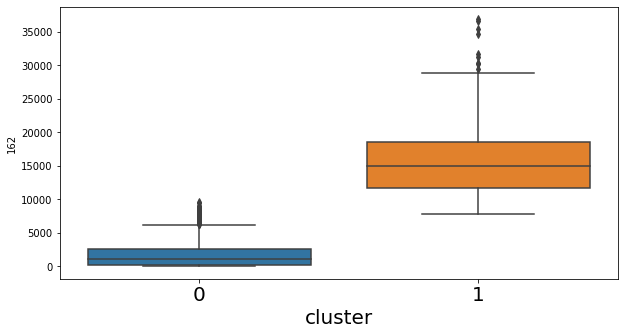

In [92]:
sns.boxplot(data=data,x='clusters',y='162')
plt.xlabel('cluster',fontsize=20)
plt.xticks(fontsize=20)

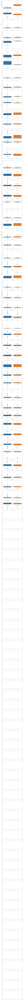

In [93]:
#boxplot all the top mismatches
plt.rcParams['figure.figsize'] = [10,500]
fig,axes = plt.subplots(100,1)
i=0
for feature in mismatch_features["features"]:
    sns.boxplot(data=data,x='clusters',y=str(feature),ax = axes[i])
    i+=1
    

In [ ]:
#Try to compare top mismatch feature 162 with other features and color by cluster. Look for anything interesting.

feature_list = data.columns.drop(['Time','Pass/Fail','clusters'])
n = len(feature_list)
plt.rcParams['figure.figsize'] = [5,700]
fig,axes = plt.subplots(538,1)
i=0
for feature in feature_list:
    sns.scatterplot(data=data,x='162',y=str(feature), hue='clusters',ax = axes[i])
    i+=1
    
    
